In [1]:
!pip install geopandas
import geopandas as gpd
import pandas as pd
!pip install geemap
import geemap
import ee

     |████████████████████████████████| 1.0 MB 2.1 MB/s eta 0:00:01
     |████████████████████████████████| 7.7 MB 2.3 MB/s eta 0:00:01
     |████████████████████████████████| 19.3 MB 3.7 MB/s eta 0:00:01
     |████████████████████████████████| 1.2 MB 3.0 MB/s eta 0:00:01
     |████████████████████████████████| 1.9 MB 4.2 MB/s eta 0:00:01
     |████████████████████████████████| 219 kB 5.2 MB/s eta 0:00:01
     |████████████████████████████████| 76 kB 4.4 MB/s eta 0:00:011
     |████████████████████████████████| 231 kB 3.9 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 2.2 MB/s eta 0:00:01
     |████████████████████████████████| 130 kB 2.9 MB/s eta 0:00:01
     |████████████████████████████████| 111 kB 4.4 MB/s eta 0:00:01
     |████████████████████████████████| 93 kB 2.6 MB/s eta 0:00:01
     |████████████████████████████████| 1.3 MB 3.5 MB/s eta 0:00:01
     |████████████████████████████████| 26.5 MB 4.4 MB/s eta 0:00:01
     |████████████████████████████████| 1.7 MB 

     |████████████████████████████████| 111 kB 6.4 MB/s eta 0:00:01
     |████████████████████████████████| 207 kB 2.2 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 3.9 MB/s eta 0:00:01
     |████████████████████████████████| 155 kB 4.1 MB/s eta 0:00:01


     |████████████████████████████████| 77 kB 3.5 MB/s eta 0:00:01
     |████████████████████████████████| 70 kB 3.0 MB/s eta 0:00:01
     |████████████████████████████████| 75 kB 4.0 MB/s eta 0:00:01
     |████████████████████████████████| 96 kB 3.6 MB/s eta 0:00:011
  Created wheel for earthengine-api: filename=earthengine_api-0.1.294-py3-none-any.whl size=262094 sha256=3ea4db19cf3577b83b8ac1a5a2d9a92a4e6482ebc5609530cdb48a97588c2a3c
  Stored in directory: /Users/alicelu/Library/Caches/pip/wheels/24/db/e4/0220ae472d3ddbe606046f2c9aa72a0175930124f365416681
  Created wheel for pyshp: filename=pyshp-2.1.3-py3-none-any.whl size=37263 sha256=0e2499871b38c730ad530c40f22319611618fbb7f904b061fbe0f6593222c924
  Stored in directory: /Users/alicelu/Library/Caches/pip/wheels/1f/1b/b5/54affbefc8a7e2bdf1da000fc576b8a1c91338f1f327a04f4c
  Created wheel for httplib2shim: filename=httplib2shim-0.0.3-py2.py3-none-any.whl size=18059 sha256=96927d1bc1b5fa484e352f2b663dd284009cca58aa496a6646487595cb0025e

In [2]:
from operator import itemgetter
from datetime import datetime, timedelta
from shapely.geometry import Polygon, LineString, MultiPolygon
from shapely.ops import split

import subprocess

import time
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import copy

In [3]:
ee.Authenticate()

Enter verification code: 4/1AX4XfWhk3Nf2RtoglDku6asVoCGXdQn_zyiuRqcAMIQw_wPQNlwl8MNMhiA

Successfully saved authorization token.


In [4]:
ee.Initialize()

In [5]:
df = gpd.read_file("California_Fire_Perimeters_(all).geojson")
df = df[(df["GIS_ACRES"] >= 5000) & (~df["CONT_DATE"].isna())]
df.head()

,OBJECTID,YEAR_,STATE,AGENCY,UNIT_ID,FIRE_NAME,INC_NUM,ALARM_DATE,CONT_DATE,CAUSE,COMMENTS,REPORT_AC,GIS_ACRES,C_METHOD,OBJECTIVE,FIRE_NUM,SHAPE_Length,SHAPE_Area,geometry
21,21462,2020,CA,CDF,CZU,CZU LIGHTNING COMPLEX,00005205,2020-08-16T00:00:00+00:00,2020-09-24T00:00:00+00:00,1.0,None,86509.0,86553.4610,7.0,1.0,None,2.054992,0.035526,"MULTIPOLYGON (((-122.12815 37.02800, -122.1281..."
39,21480,2020,CA,CDF,ORC,SILVERADO,20121364,2020-10-26T00:00:00+00:00,2020-11-02T00:00:00+00:00,14.0,,0.0,12469.2000,7.0,1.0,None,0.538848,0.004908,"MULTIPOLYGON (((-117.71346 33.74971, -117.7124..."
40,21481,2020,CA,CDF,ORC,BLUE RIDGE,20121612,2020-10-26T00:00:00+00:00,2020-11-02T00:00:00+00:00,14.0,,0.0,13694.5300,7.0,1.0,None,0.545948,0.005403,"MULTIPOLYGON (((-117.73680 33.94161, -117.7364..."
41,21482,2020,CA,CDF,ORC,BOND,20136890,2020-12-03T00:00:00+00:00,2020-12-07T00:00:00+00:00,14.0,,0.0,6681.1011,7.0,1.0,None,0.442161,0.002631,"MULTIPOLYGON (((-117.63796 33.74451, -117.6373..."
74,21515,2020,CA,CCO,KRN,STAGECOACH,02033315,2020-08-03T00:00:00+00:00,2020-08-03T00:00:00+00:00,14.0,None,7750.0,7750.6372,1.0,1.0,None,0.390034,0.003114,"MULTIPOLYGON (((-118.47205 35.44494, -118.4732..."


In [6]:
counties = gpd.read_file('California_County_Boundaries.geojson')
counties

,OBJECTID,COUNTY_NAME,COUNTY_ABBREV,COUNTY_NUM,COUNTY_CODE,COUNTY_FIPS,ISLAND,GlobalID,SHAPE_Length,SHAPE_Area,geometry
0,1,Alameda,ALA,1,01,001,None,{E6F92268-D2DD-4CFB-8B79-5B4B2F07C559},2.538264,0.217411,"MULTIPOLYGON (((-122.27125 37.90503, -122.2702..."
1,2,Alpine,ALP,2,02,003,None,{870479B2-480A-494B-8352-AD60578839C1},2.170420,0.198471,"MULTIPOLYGON (((-119.58667 38.71420, -119.5865..."
2,3,Amador,AMA,3,03,005,None,{4F45B3A6-BE10-461C-8945-6B2AAA7119F6},2.924268,0.161961,"MULTIPOLYGON (((-120.07246 38.70276, -120.0724..."
3,4,Butte,BUT,4,04,007,None,{44FBA680-AECC-4E04-A499-29D69AFFBD4A},4.210365,0.455899,"MULTIPOLYGON (((-121.07661 39.59729, -121.0794..."
4,5,Calaveras,CAL,5,05,009,None,{D11EF739-4A1E-414E-BFD1-E7DCD56CD61E},2.989673,0.275908,"MULTIPOLYGON (((-120.01792 38.43586, -120.0178..."
5,6,Colusa,COL,6,06,011,None,{7BB40E7D-335A-4E8F-AABA-F003090D32EF},3.214885,0.312332,"MULTIPOLYGON (((-121.89004 39.38393, -121.8900..."
6,7,Contra Costa,CON,7,07,013,None,{36D6618E-1D85-423D-81C5-D5FADE320099},2.681076,0.213175,"MULTIPOLYGON (((-121.57386 38.09003, -121.5735..."
7,8,Del Norte,DEL,8,08,015,None,{1C9D9309-A72C-464F-9981-FE8358F354AC},3.123064,0.284410,"MULTIPOLYGON (((-123.77288 41.99599, -123.7512..."
8,9,El Dorado,ELD,9,09,017,None,{8C7709F7-3E81-4245-85D6-3FBC6EBD7261},3.835176,0.480330,"MULTIPOLYGON (((-120.00249 39.06748, -120.0017..."
9,10,Fresno,FRE,10,10,019,None,{F57A290A-F11E-4B3B-A53B-E8E4C2284BBB},9.045699,1.570875,"MULTIPOLYGON (((-119.01993 37.58366, -119.0192..."


In [7]:
sanFran = counties[counties.COUNTY_NAME == 'San Francisco']
lower_bound = sanFran.bounds.miny.values[0]
counties = counties[counties.bounds.miny>lower_bound]
counties = counties.to_crs("EPSG:3310")
counties

,OBJECTID,COUNTY_NAME,COUNTY_ABBREV,COUNTY_NUM,COUNTY_CODE,COUNTY_FIPS,ISLAND,GlobalID,SHAPE_Length,SHAPE_Area,geometry
1,2,Alpine,ALP,2,02,003,None,{870479B2-480A-494B-8352-AD60578839C1},2.170420,0.198471,"MULTIPOLYGON (((35902.203 77651.499, 35914.382..."
2,3,Amador,AMA,3,03,005,None,{4F45B3A6-BE10-461C-8945-6B2AAA7119F6},2.924268,0.161961,"MULTIPOLYGON (((-6295.234 76303.563, -6299.075..."
3,4,Butte,BUT,4,04,007,None,{44FBA680-AECC-4E04-A499-29D69AFFBD4A},4.210365,0.455899,"MULTIPOLYGON (((-92398.590 176241.528, -92657...."
4,5,Calaveras,CAL,5,05,009,None,{D11EF739-4A1E-414E-BFD1-E7DCD56CD61E},2.989673,0.275908,"MULTIPOLYGON (((-1561.980 46633.259, -1558.980..."
5,6,Colusa,COL,6,06,011,None,{7BB40E7D-335A-4E8F-AABA-F003090D32EF},3.214885,0.312332,"MULTIPOLYGON (((-162675.355 153629.529, -16267..."
6,7,Contra Costa,CON,7,07,013,None,{36D6618E-1D85-423D-81C5-D5FADE320099},2.681076,0.213175,"MULTIPOLYGON (((-137851.484 9332.872, -137829...."
7,8,Del Norte,DEL,8,08,015,None,{1C9D9309-A72C-464F-9981-FE8358F354AC},3.123064,0.284410,"MULTIPOLYGON (((-313130.326 448215.960, -31132..."
8,9,El Dorado,ELD,9,09,017,None,{8C7709F7-3E81-4245-85D6-3FBC6EBD7261},3.835176,0.480330,"MULTIPOLYGON (((-215.124 116839.785, -153.547 ..."
10,11,Glenn,GLE,11,11,021,None,{BAC1DCFD-A28A-4C21-936F-B8E299026A9F},3.293182,0.360341,"MULTIPOLYGON (((-175152.526 199872.564, -17502..."
11,12,Humboldt,HUM,12,12,023,None,{7E8E7246-D282-4143-A943-105360EE37E6},5.199454,0.996223,"MULTIPOLYGON (((-315301.078 389270.925, -31561..."


In [8]:
df = df[df.bounds.miny>lower_bound]

<AxesSubplot:>

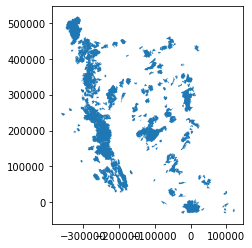

In [9]:
# geometry for each fire in Northern California (no buffer)
df = df.to_crs('EPSG:3310')
df.plot()

In [13]:
def boundsBuffer(x, buffer=0.2):
    """
    Returns a Polygon geometry that represents a bounding box with a default 20% buffer
    """
    minx, miny, maxx, maxy = x
    buffer_x, buffer_y = np.abs(buffer*(maxx-minx)), np.abs(buffer*(maxy-miny))
    minx -= buffer_x
    maxx += buffer_x
    miny -= buffer_y
    maxy += buffer_y
    
    coords = ((minx, miny), (minx, maxy), (maxx, maxy), (maxx, miny))
    return Polygon(coords)

bd = copy.deepcopy(df)
bd["geometry"] = df["geometry"].bounds.apply(boundsBuffer, axis=1)
print(df.shape)
df.head()

(268, 19)


,OBJECTID,YEAR_,STATE,AGENCY,UNIT_ID,FIRE_NAME,INC_NUM,ALARM_DATE,CONT_DATE,CAUSE,COMMENTS,REPORT_AC,GIS_ACRES,C_METHOD,OBJECTIVE,FIRE_NUM,SHAPE_Length,SHAPE_Area,geometry
119,21560,2020,CA,CDF,SHU,ZOGG,00009978,2020-09-27T00:00:00+00:00,2020-10-13T00:00:00+00:00,14.0,None,56338.0,56338.0510,3.0,1.0,None,1.501520,0.024199,"MULTIPOLYGON (((-220179.597 264709.756, -22021..."
128,21569,2020,CA,CDF,AEU,GRANT FIRE,00016543,2020-06-12T00:00:00+00:00,2020-06-12T00:00:00+00:00,2.0,None,5042.0,5062.1982,1.0,1.0,None,0.252374,0.002118,"MULTIPOLYGON (((-103340.322 58270.931, -103352..."
224,21665,2020,CA,CDF,LNU,WALLBRIDGE,00013407,2020-08-17T00:00:00+00:00,2020-09-02T00:00:00+00:00,1.0,Part of the LNU LIGHTNING COMPLEX,NaN,55208.8910,7.0,1.0,None,1.274838,0.023110,"MULTIPOLYGON (((-252991.618 63578.193, -252990..."
225,21666,2020,CA,CDF,LNU,HENNESSEY,00013337,2020-08-17T00:00:00+00:00,2020-09-16T00:00:00+00:00,1.0,Part of the LNU LIGHTNING COMPLEX,305651.0,305351.5900,7.0,1.0,None,8.069204,0.127819,"MULTIPOLYGON (((-202093.125 89447.516, -202077..."
226,21667,2020,CA,CDF,LNU,GLASS,00015497,2020-09-27T00:00:00+00:00,2020-10-20T00:00:00+00:00,14.0,J. Baldwin,NaN,67484.3440,7.0,1.0,None,2.182406,0.028218,"MULTIPOLYGON (((-223611.434 49192.085, -223605..."


<AxesSubplot:>

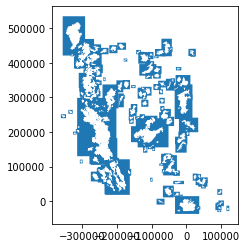

In [14]:
# geometry with only buffers for each fire in Northern California
bd = gpd.overlay(bd, df, how='difference')
bd.plot()

In [4]:
"""
    Title: Algorithm to subdivide a polygon in smaller polygons
    Author: Aditya Chhabra
    Date: Dec 6, 2020
    Availability: https://stackoverflow.com/questions/8491927/algorithm-to-subdivide-a-polygon-in-smaller-polygons

"""
def get_squares_from_rect(RectangularPolygon, side_length=1):
    rect_coords = np.array(RectangularPolygon.boundary.coords.xy)
    y_list = rect_coords[1]
    x_list = rect_coords[0]
    y1 = min(y_list)
    y2 = max(y_list)
    x1 = min(x_list)
    x2 = max(x_list)
    width = x2 - x1
    height = y2 - y1

    xcells = int(np.round(width / side_length))
    ycells = int(np.round(height / side_length))

    yindices = np.linspace(y1, y2, ycells + 1)
    xindices = np.linspace(x1, x2, xcells + 1)
    horizontal_splitters = [
        LineString([(x, yindices[0]), (x, yindices[-1])]) for x in xindices
    ]
    vertical_splitters = [
        LineString([(xindices[0], y), (xindices[-1], y)]) for y in yindices
    ]
    result = RectangularPolygon
    for splitter in vertical_splitters:
        result = MultiPolygon(split(result, splitter))
    for splitter in horizontal_splitters:
        result = MultiPolygon(split(result, splitter))
    square_polygons = list(result)

    return square_polygons


def split_polygon(G, side_length=1, thresh=0.9):        
    Rectangle = G.envelope
    squares = get_squares_from_rect(Rectangle, side_length=side_length)
    squaredf = gpd.GeoDataFrame(squares).rename(columns={0: "geometry"})
    geoms = squaredf[squaredf.intersects(G)].geometry.values
    geoms = [g for g in geoms if ((g.intersection(G)).area / g.area) >= thresh]
    return geoms

In [ ]:
now = datetime.now()
now = now - timedelta(days = 30 )
dur = now - timedelta(days = 20 )
now = now.strftime("%Y-%m-%d")
dur = dur.strftime("%Y-%m-%d")

In [ ]:
ee_g = []
pl = gpd.GeoDataFrame()
pl['geometry'] = temp['geometry'].values
pl.crs = 3310
for i in pl['geometry'].values:
    x,y = i.exterior.coords.xy
    cords = np.dstack((x,y)).tolist()
    ee_g.append(ee.Feature(ee.Geometry.Polygon(cords)))
ee_g = ee.FeatureCollection(ee_g)

In [ ]:
l8 = ee.ImageCollection('LANDSAT/LC08/C01/T1').filterDate(dur, now).filterBounds(de_g).filter(ee.Filter.lt('CLOUD_COVER', 20))

{'type': 'ImageCollection',
 'bands': [],
 'id': 'LANDSAT/LC08/C01/T1',
 'version': 1641990238413551,
 'properties': {'system:visualization_0_min': '0.0',
  'type_name': 'ImageCollection',
  'keywords': ['c1',
   'global',
   'l8',
   'landsat',
   'lc8',
   'oli_tirs',
   'radiance',
   't1',
   'tier1',
   'usgs'],
  'visualization_1_bands': 'B5,B4,B3',
  'thumb': 'https://mw1.google.com/ges/dd/images/LANDSAT_RAW_thumb.png',
  'visualization_1_max': '30000.0',
  'description': '<p>Landsat 8 Collection 1 Tier 1 DN values, representing scaled, calibrated at-sensor radiance.</p><p>Landsat scenes with the highest available data quality\nare placed into Tier 1 and are considered suitable for time-series processing\nanalysis. Tier 1 includes Level-1 Precision Terrain (L1TP) processed data\nthat have well-characterized radiometry and are inter-calibrated across the\ndifferent Landsat sensors. The georegistration of Tier 1 scenes will be\nconsistent and within prescribed tolerances [&lt;=12 

In [ ]:
from shapely.geometry import shape
def fc2df(fc):
    features = fc.getInfo()['features']

    dictarr = []

    for f in features:
        attr = f['properties']
        attr['geometry'] = f['geometry']
        dictarr.append(attr)

    df = gpd.GeoDataFrame(dictarr)
    df['geometry'] = list(map(lambda s: shape(s), df.geometry))
    return df


def extract_point_values(img_id, pts):
    image = ee.Image(img_id)

    fc_image_red = image.reduceRegions(collection=pts,reducer=ee.Reducer.max(),scale=30)

    df_image_red = fc2df(fc_image_red)

    df_image_red['date'] = image.getInfo()['properties']['DATE_ACQUIRED']

    return df_image_red

num = list(range(0,len(ee_g),len(ee_g)//100))
num.append(len(ee_g))
df_final = pd.DataFrame()
for i in range(0,len(num)-1):
    de_g = []
    pl = gpd.GeoDataFrame()
    pl['geometry'] = temp['geometry'].values[max(0,num[i]):num[i+1]]
    pl.crs = 3310
    for i in pl['geometry'].values:
        x,y = i.exterior.coords.xy
        cords = np.dstack((x,y)).tolist()
        de_g.append(ee.Feature(ee.Geometry.Polygon(cords)))
    de_g = ee.FeatureCollection(de_g)
    l8 = ee.ImageCollection('LANDSAT/LC08/C01/T1').filterDate(dur, now).filterBounds(de_g).filter(ee.Filter.lt('CLOUD_COVER', 20))

    l8_id = []
    fe = lg.getInfo()['features']
    for f in fe:
        image_id = f['id']
        image_id = str(image_id)
        l8_id.append(image_id)

    df_all = extract_point_values(l8_id[0], de_g)
    df_all = df_all.drop([0,1])

    for i in l8_id:
        df_all.append(extract_point_values(i, de_g))
    df_final = pd.concat(df_final,df_all)
df_all    

KeyboardInterrupt: 

In [ ]:
#north = counties.dissolve()
#t = north.geometry.values[0]
#sq = split_polygon(t,side_length=30)
#temp = gpd.GeoDataFrame()
#temp['geometry'] = sq
#temp.crs = 3310
#temp.to_csv("NorthCA_30x30.csv", index=False)